In [1]:
library(tidyverse)
library(tidymodels)
library(RColorBrewer)
library(repr)
library(ggplot2)
install.packages("kknn")
install.packages("themis") 

── Attaching packages ─────────────────────────────────────── tidyverse 1.3.2 ──
✔ ggplot2 3.4.2     ✔ purrr   1.0.1
✔ tibble  3.2.1     ✔ dplyr   1.1.1
✔ tidyr   1.3.0     ✔ stringr 1.5.0
✔ readr   2.1.3     ✔ forcats 0.5.2
── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()
── Attaching packages ────────────────────────────────────── tidymodels 1.0.0 ──

✔ broom        1.0.2     ✔ rsample      1.1.1
✔ dials        1.1.0     ✔ tune         1.0.1
✔ infer        1.0.4     ✔ workflows    1.1.2
✔ modeldata    1.0.1     ✔ workflowsets 1.0.0
✔ parsnip      1.0.3     ✔ yardstick    1.1.0
✔ recipes      1.0.4     

── Conflicts ───────────────────────────────────────── tidymodels_conflicts() ──
✖ scales::discard() masks purrr::discard()
✖ dplyr::filter()   masks stats::filter()
✖ recipes::fixed()  masks stringr::fixed()
✖ dplyr::lag()      masks stats::lag()
✖ yardstick::spec() masks read

We have loaded seven libraries to use for our data analysis. Tidyverse is used for tidying the data using functions like select, filter, and arrange. Tidymodels is used to build and tune the classifier. RColorBrewer enables us to wrangle our data to build the classifier with ease and allows people who read it to reproduce it. Repr allows us to change the size of the plot of our variables, ensuring proper and clear visualizations. Ggplot2 is used to conduct any changes in the code for visualization. Kknn package allows us to kknn engine in the recipe so our classifier works. Themis package enables us to do the step_upsample to ensure both classes are balanced to prevent class imbalance. 

In [2]:
url <- "https://raw.githubusercontent.com/sweetmidnights/T1-008-DataScienceProject-32/main/HTRU_2.csv"
pulsar_data <- read_csv(url, col_names = FALSE) 

colnames(pulsar_data) <- c("Mean_integ", "Standard_Deviation_Integ", "Excess_kurtosis_Integ", "Skewness_Integ", "Mean_DM", "Standard_deviation_DM", "Excess_kurtosis_DM", "Skewness_DM", "Class")
head(pulsar_data)
print("Table 1: Pulsar Plot from Internet")
#summary table
summary_data <- summary(pulsar_data)
summary_data
print("Table 2: Summary of Statistics for Predictor Variables")

Rows: 17898 Columns: 9
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
dbl (9): X1, X2, X3, X4, X5, X6, X7, X8, X9

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


Mean_integ,Standard_Deviation_Integ,Excess_kurtosis_Integ,Skewness_Integ,Mean_DM,Standard_deviation_DM,Excess_kurtosis_DM,Skewness_DM,Class
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
140.56250,55.68378,-0.23457141,-0.6996484,3.199833,19.11043,7.975532,74.24222,0
102.50781,58.88243,0.46531815,-0.5150879,1.677258,14.86015,10.576487,127.39358,0
103.01562,39.34165,0.32332837,1.0511644,3.121237,21.74467,7.735822,63.17191,0
136.75000,57.17845,-0.06841464,-0.6362384,3.642977,20.95928,6.896499,53.59366,0
88.72656,40.67223,0.60086608,1.1234917,1.178930,11.46872,14.269573,252.56731,0
93.57031,46.69811,0.53190485,0.4167211,1.636288,14.54507,10.621748,131.39400,0


[1] "Table 1: Pulsar Plot from Internet"


   Mean_integ      Standard_Deviation_Integ Excess_kurtosis_Integ
 Min.   :  5.812   Min.   :24.77            Min.   :-1.8760      
 1st Qu.:100.930   1st Qu.:42.38            1st Qu.: 0.0271      
 Median :115.078   Median :46.95            Median : 0.2232      
 Mean   :111.080   Mean   :46.55            Mean   : 0.4779      
 3rd Qu.:127.086   3rd Qu.:51.02            3rd Qu.: 0.4733      
 Max.   :192.617   Max.   :98.78            Max.   : 8.0695      
 Skewness_Integ       Mean_DM         Standard_deviation_DM Excess_kurtosis_DM
 Min.   :-1.7919   Min.   :  0.2132   Min.   :  7.37        Min.   :-3.139    
 1st Qu.:-0.1886   1st Qu.:  1.9231   1st Qu.: 14.44        1st Qu.: 5.782    
 Median : 0.1987   Median :  2.8018   Median : 18.46        Median : 8.434    
 Mean   : 1.7703   Mean   : 12.6144   Mean   : 26.33        Mean   : 8.304    
 3rd Qu.: 0.9278   3rd Qu.:  5.4643   3rd Qu.: 28.43        3rd Qu.:10.703    
 Max.   :68.1016   Max.   :223.3921   Max.   :110.64        Max.

[1] "Table 2: Summary of Statistics for Predictor Variables"


In [3]:
pulsar_cor <- cor(pulsar_data)
pulsar_cor

,Mean_integ,Standard_Deviation_Integ,Excess_kurtosis_Integ,Skewness_Integ,Mean_DM,Standard_deviation_DM,Excess_kurtosis_DM,Skewness_DM,Class
Mean_integ,1.0000000,0.547136926,-0.8738984,-0.7387748,-0.298840844,-0.30701583,0.23433123,0.14403302,-0.6731806
Standard_Deviation_Integ,0.5471369,1.000000000,-0.5214353,-0.5397930,0.006868735,-0.04763159,0.02942939,0.02769148,-0.3637082
Excess_kurtosis_Integ,-0.8738984,-0.521435272,1.0000000,0.9457291,0.414367611,0.43288016,-0.34120902,-0.21449091,0.7915914
Skewness_Integ,-0.7387748,-0.539792970,0.9457291,1.0000000,0.412056437,0.41513996,-0.32884331,-0.20478247,0.7095280
Mean_DM,-0.2988408,0.006868735,0.4143676,0.4120564,1.000000000,0.79655484,-0.61597083,-0.35426915,0.4008761
Standard_deviation_DM,-0.3070158,-0.047631587,0.4328802,0.4151400,0.796554844,1.00000000,-0.80978582,-0.57579983,0.4915351
Excess_kurtosis_DM,0.2343312,0.029429387,-0.3412090,-0.3288433,-0.615970831,-0.80978582,1.00000000,0.92374273,-0.3908163
Skewness_DM,0.1440330,0.027691480,-0.2144909,-0.2047825,-0.354269152,-0.57579983,0.92374273,1.00000000,-0.2591167
Class,-0.6731806,-0.363708209,0.7915914,0.7095280,0.400876093,0.49153506,-0.39081632,-0.25911670,1.0000000


First, load the data set from the internet into R. We do that by using read_csv since the data has comma-separated values. Also, we manually input the column since it does not come with the data set and use the head function to see the table since it is extensive in size. Next, I used the summary function to summarizes the data set. We have selected the columns Mean_integ and Standard_deviation_DM ,and we notice that the range of the mean is 186.8 ,which is very large ;the mean is lower than the median ,which indicates most of the values of the mean is below 100. The range of the standard deviation is 103.27 ,and its mean is larger than the median ,so most of the data set has a larger value for standard deviation.

In [4]:
types_of_stars <- pulsar_data |>
                  distinct(Class)
print("Table 3: Different Classes in Data Set")
types_of_stars

[1] "Table 3: Different Classes in Data Set"


Class
<dbl>
0
1


We used distinct to see the different classes present in the class column, to rename them correctly.

In [5]:
pulsar <- pulsar_data |>
  mutate(Class = as_factor(Class)) |>
  mutate(Class = fct_recode(Class, "Pulsar" = "1", "Not Pulsar" = "0"))
head(pulsar)
print("Table 4: Data Set with renamed classes")

Mean_integ,Standard_Deviation_Integ,Excess_kurtosis_Integ,Skewness_Integ,Mean_DM,Standard_deviation_DM,Excess_kurtosis_DM,Skewness_DM,Class
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>
140.56250,55.68378,-0.23457141,-0.6996484,3.199833,19.11043,7.975532,74.24222,Not Pulsar
102.50781,58.88243,0.46531815,-0.5150879,1.677258,14.86015,10.576487,127.39358,Not Pulsar
103.01562,39.34165,0.32332837,1.0511644,3.121237,21.74467,7.735822,63.17191,Not Pulsar
136.75000,57.17845,-0.06841464,-0.6362384,3.642977,20.95928,6.896499,53.59366,Not Pulsar
88.72656,40.67223,0.60086608,1.1234917,1.178930,11.46872,14.269573,252.56731,Not Pulsar
93.57031,46.69811,0.53190485,0.4167211,1.636288,14.54507,10.621748,131.39400,Not Pulsar


[1] "Table 4: Data Set with renamed classes"


Then, we used fct_recode to make Class a factor data type and renamed 1 to Pulsar and 0 to Not Pulsar; we changed the data type since it holds a categorical variable.

In [6]:
pulsar_data <- pulsar |>
                select(Mean_integ, Standard_deviation_DM, Class)
head(pulsar_data)
print("Table 5: Data Set with only predictor variables")

Mean_integ,Standard_deviation_DM,Class
<dbl>,<dbl>,<fct>
140.56250,19.11043,Not Pulsar
102.50781,14.86015,Not Pulsar
103.01562,21.74467,Not Pulsar
136.75000,20.95928,Not Pulsar
88.72656,11.46872,Not Pulsar
93.57031,14.54507,Not Pulsar


[1] "Table 5: Data Set with only predictor variables"


We only select the two column (predictor variables) required to build the classifier, which are Mean-Integrated and Standard Deviation of DM-SNR.

[1] "Plot 1: Initial Plot of Dataset"


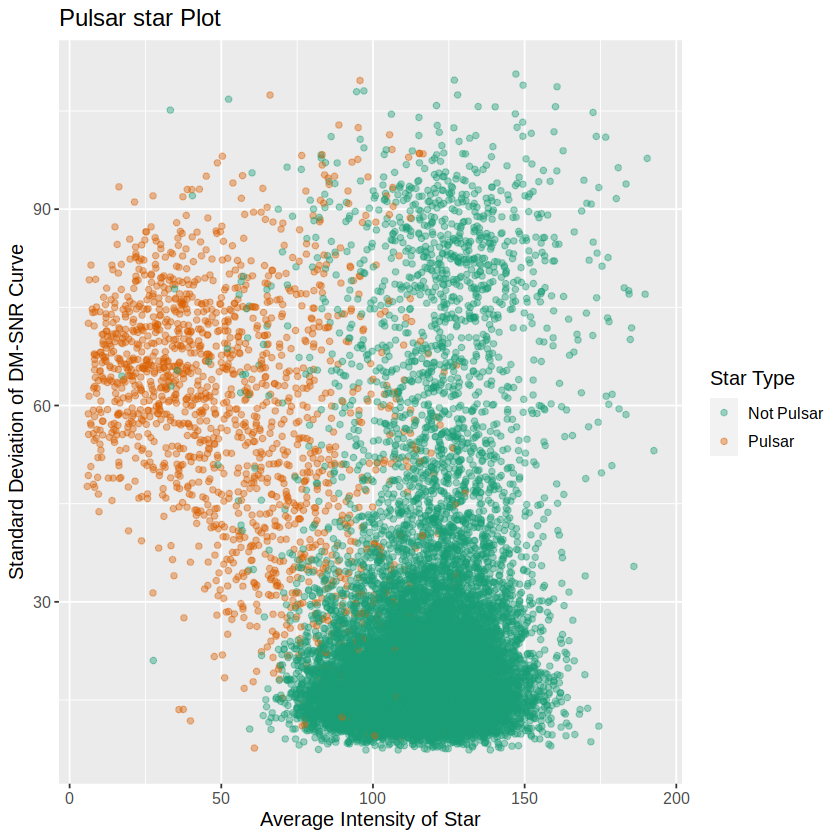

In [7]:
plot_pulsar <- ggplot(pulsar_data , aes(x = Mean_integ, y = Standard_deviation_DM, color = Class)) +
                   geom_point(alpha = 0.4) +
                   xlab("Average Intensity of Star") +
                   ylab("Standard Deviation of DM-SNR Curve") + 
                   labs(color = 'Star Type') +
                   theme(text = element_text(size = 12)) +
                   scale_color_brewer(palette = "Dark2") +
                   ggtitle("Pulsar star Plot") #title for the plot

plot_pulsar
print("Plot 1: Initial Plot of Dataset")


Now, we create an initial visualization to observe the distribution of the classes. From this plot, we notice that most of the pulsar stars have a low average intensity but a high standard deviation. All of the non-pulsar stars have a very high intensity and most of them have a low standard deviation.

In [8]:
set.seed(1)
pulsar_split <- initial_split(pulsar_data, prop = 0.75, strata = Class) 
pulsar_train <- training(pulsar_split)
pulsar_test <- testing(pulsar_split)
glimpse(pulsar_train)
glimpse(pulsar_test)


Rows: 13,423
Columns: 3
$ Mean_integ            <dbl> 102.50781, 103.01562, 136.75000, 93.57031, 119.4…
$ Standard_deviation_DM <dbl> 14.860146, 21.744669, 20.959280, 14.545074, 9.27…
$ Class                 <fct> Not Pulsar, Not Pulsar, Not Pulsar, Not Pulsar, …
Rows: 4,475
Columns: 3
$ Mean_integ            <dbl> 140.56250, 88.72656, 142.07812, 133.25781, 109.6…
$ Standard_deviation_DM <dbl> 19.11043, 11.46872, 29.00990, 12.00781, 12.07290…
$ Class                 <fct> Not Pulsar, Not Pulsar, Not Pulsar, Not Pulsar, …


Next, now that our data is tidy. We split the data set into training and testing with 75% of the data for training. We use glimpse to see the total observations in the training set (13,423) and the testing set (4475). Also, we used set.seed to make our code reproducible.

In [9]:
pulsar_proportions <- pulsar_train |>
                      group_by(Class) |>
                      summarize(n = n()) |>
                      mutate(percent = 100*n/nrow(pulsar_train))

pulsar_proportions
print("Table 5: Unbalanced training set proportions")

Class,n,percent
<fct>,<int>,<dbl>
Not Pulsar,12200,90.888773
Pulsar,1223,9.111227


[1] "Table 5: Unbalanced training set proportions"


We used this code to determine the proportion of the training set that is pulsar and not pulsar. We did this by grouping the classes (Pulsar and Not Pulsar) and counting the number of rows of each group and dividing it by the initial number of rows and multiplying it with 100 to get the percentage.

In [10]:
library(themis)

balance_recipe <- recipe(Class ~ ., data = pulsar_train) |>
  step_upsample(Class, over_ratio = 1, skip = FALSE) |>
    prep()
pulsar_balanced <- bake(balance_recipe, pulsar_train)
pulsar_balanced |>
    group_by(Class) |>
    summarize(n = n())

Class,n
<fct>,<int>
Not Pulsar,12200
Pulsar,12200


As we saw, 91% of the stars are not pulsar and only 9% are pulsar, this could lead to class imbalance. To prevent this we used step_upsample from library themis through the recipe to make sure both class types have an equal proportion.

In [11]:
pulsar_proportions_2 <- pulsar_balanced |>
                      group_by(Class) |>
                      summarize(n = n()) |>
                      mutate(percent = 100*n/nrow(pulsar_balanced))

pulsar_proportions_2
print("Table 6: Balanced training set proportions")

Class,n,percent
<fct>,<int>,<dbl>
Not Pulsar,12200,50
Pulsar,12200,50


[1] "Table 6: Balanced training set proportions"


This code is the same as the one used to calculate proportions in the training set, now we do it on the balanced data set and it shows both class types are equal in number.

In [12]:
set.seed(6969)
k_vals <- tibble(neighbors = seq(from = 1, to = 101, by = 5))

pulsar_recipe <- recipe(Class ~ ., 
                        data = pulsar_train) |>
  step_scale(all_predictors()) |>
  step_center(all_predictors())

knn_spec <- nearest_neighbor(weight_func = "rectangular", neighbors = tune()) |>
            set_engine("kknn") |>
            set_mode("classification")

pulsar_vfold <- vfold_cv(pulsar_train, v = 10, strata = Class)

knn_results <- workflow() |>
  add_recipe(pulsar_recipe) |>
  add_model(knn_spec) |>
  tune_grid(resamples = pulsar_vfold, grid = k_vals) |>
  collect_metrics() 

accuracies <- knn_results |>
  filter(.metric == "accuracy")
print("Table 7: Accuracy of classifier with each K-value in range")

accuracies

[1] "Table 7: Accuracy of classifier with each K-value in range"


neighbors,.metric,.estimator,mean,n,std_err,.config
<dbl>,<chr>,<chr>,<dbl>,<int>,<dbl>,<chr>
1,accuracy,binary,0.9564925,10,0.0014409955,Preprocessor1_Model01
6,accuracy,binary,0.9703493,10,0.0011903856,Preprocessor1_Model02
11,accuracy,binary,0.9715414,10,0.0010813141,Preprocessor1_Model03
16,accuracy,binary,0.9722117,10,0.0009367383,Preprocessor1_Model04
21,accuracy,binary,0.9724350,10,0.0011817171,Preprocessor1_Model05
26,accuracy,binary,0.9730309,10,0.0012368885,Preprocessor1_Model06
31,accuracy,binary,0.9731055,10,0.0012887627,Preprocessor1_Model07
36,accuracy,binary,0.9727330,10,0.0013066638,Preprocessor1_Model08
41,accuracy,binary,0.9734036,10,0.0013009987,Preprocessor1_Model09


First, we create a range of possible k-values using tibble. Next, create a recipe and scale and center all predictors to ensure equal weightage for variables. We use the training set ONLY for building the classifier; we test the classifier's accuracy using the testing set. Then, we create a model using the kknn engine and specify neighbors as tune. We then separate the training set into ten equal data sets using vfold_cv. Finally, we run all possible k-values in the workflow and check for the accuracy of all the k-values. 



In [13]:
new <- arrange(accuracies, by = desc(mean))
head(new, n = 1)
print("Table 8: The K-value with highest accuracy")



neighbors,.metric,.estimator,mean,n,std_err,.config
<dbl>,<chr>,<chr>,<dbl>,<int>,<dbl>,<chr>
41,accuracy,binary,0.9734036,10,0.001300999,Preprocessor1_Model09


[1] "Table 8: The K-value with highest accuracy"


This code takes arranges the data set with the highest accuracy on the top and we choose the first one on the data set. We record the K-value of this observation.

[1] "Plot 2: The visualization of K-value against accuracy"


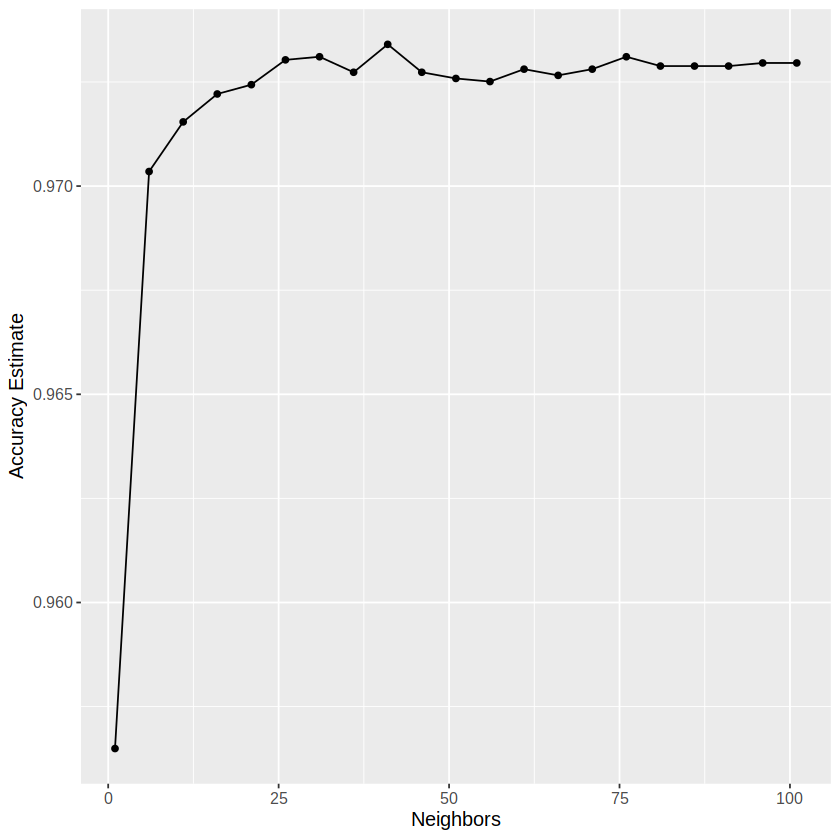

In [14]:
accuracy_vs_k <- ggplot(accuracies, aes(x = neighbors, y = mean)) +
  geom_point() +
  geom_line() +
  labs(x = "Neighbors", y = "Accuracy Estimate") + 
  theme(text = element_text(size = 12))
print("Plot 2: The visualization of K-value against accuracy")

accuracy_vs_k

This is a visualization of the accuracy within the range of possible K value, this confirms that the K-value with the maximum accuracy is between 25 and 50.

In [15]:
knn_spec_tuned <- nearest_neighbor(weight_func = "rectangular", neighbors = 41) |>
            set_engine("kknn") |>
            set_mode("classification")

knn_fit_tuned <- workflow() |>
                    add_recipe(pulsar_recipe) |>
                    add_model(knn_spec_tuned) |>
                    fit(data = pulsar_train)

We run the workflow, but this time we substitute the value of k with the highest accuracy.

In [16]:
set.seed(9999) 

# CONFUSION MATRIX FOR PULSAR DATA SET.
pulsar_predictions <- predict(knn_fit_tuned, pulsar_test) |>
  bind_cols(pulsar_test) 

pulsar_matrix <- pulsar_predictions |>
             conf_mat(truth = Class, estimate = .pred_class)
pulsar_matrix
print("Matrix 1: Confusion Matrix for trained matrix")

            Truth
Prediction   Not Pulsar Pulsar
  Not Pulsar       4031     88
  Pulsar             28    328

[1] "Matrix 1: Confusion Matrix for trained matrix"


In [17]:
# get predictions on the validation data
pulsar_predictions <- predict(knn_fit_tuned, pulsar_test) |>
  bind_cols(pulsar_test)

# compute the accuracy
pulsar_accuracy <- pulsar_predictions |>
  metrics(truth = Class, estimate = .pred_class) |>
  filter(.metric == "accuracy") |>
  select(.estimate) |>
  pull()

Accuracy <- (pulsar_accuracy * 100)
Accuracy

[1] 97.40782

 We now test the accuracy using the pulsar testing data set and it produces a 97.4% accuracy.

[1] "Plot 3: VIsualization of classes in training set"


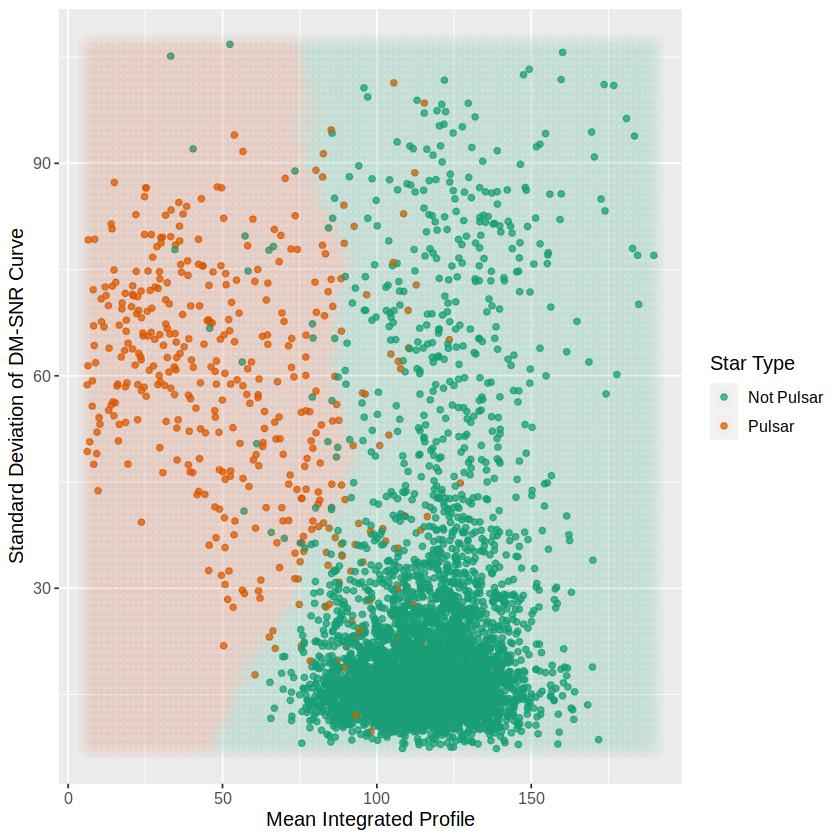

In [18]:
are_grid <- seq(min(pulsar_test$Mean_integ), 
                max(pulsar_test$Mean_integ), 
                length.out = 100)
smo_grid <- seq(min(pulsar_test$Standard_deviation_DM), 
                max(pulsar_test$Standard_deviation_DM), 
                length.out = 100)
asgrid <- as_tibble(expand.grid(Mean_integ = are_grid, 
                                Standard_deviation_DM = smo_grid))

# use the fit workflow to make predictions at the grid points
knnPredGrid <- predict(knn_fit_tuned, asgrid)

# bind the predictions as a new column with the grid points
prediction_table <- bind_cols(knnPredGrid, asgrid) |> 
  rename(Class = .pred_class)

# plot:
# 1. the colored scatter of the original data
# 2. the faded colored scatter for the grid points
wkflw_plot <-
  ggplot() +
  geom_point(data = pulsar_test, 
             mapping = aes(x = Mean_integ, 
                           y = Standard_deviation_DM, 
                           color = Class), alpha = 0.75) +
  geom_point(data = prediction_table, 
             mapping = aes(x = Mean_integ, 
                           y = Standard_deviation_DM, 
                           color = Class), 
             alpha = 0.02, 
             size = 5) +
  labs(color = "Star Type", 
       x = "Mean Integrated Profile", 
       y = "Standard Deviation of DM-SNR Curve") +
  scale_color_brewer(palette = "Dark2") +
  theme(text = element_text(size = 12))
print("Plot 3: VIsualization of classes in training set")

wkflw_plot

This visualization confirms our hypothesis that most pulsar stars have a low mean integrated profile and have a large standard deviation. 